## Model Definition & Training
This notebook takes the HDF5 files as model inputs and trains the object detection model.

In [1]:
# Set environment variable
# from os import environ
# environ['TF_ENABLE_ONEDNN_OPTS'] = '0'  # Due to OneDNN operations, turn off floating-point round-off to minimise data error

# Import libraries
import h5py
import json
import numpy as np
import cv2

import tensorflow as tf
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()


import matplotlib.pyplot as plt
from collections import defaultdict
import time
from keras import Input
from keras.applications.vgg19 import VGG19
from keras.applications import MobileNetV2
from keras.callbacks import ModelCheckpoint, TerminateOnNaN, EarlyStopping, ReduceLROnPlateau
from keras.layers import GlobalAveragePooling2D, Dense, Dropout, Flatten, Normalization, Conv2D, MaxPooling2D, SpatialDropout2D, BatchNormalization
from keras.models import Model, model_from_json, Sequential
from keras.layers import Rescaling, RandomFlip, RandomContrast, RandomZoom, RandomHeight, RandomWidth
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from tensorflow.python.keras import backend as K
import tensorflow_addons as tfa
# Import custom modules
import config as c

# Add matplotlib inline
%matplotlib inline

2023-07-10 17:19:13.985953: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-07-10 17:19:14.268531: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-10 17:19:15.365565: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/media/dan/Neuron/GSI/train/.venv/lib/python3.8/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until 

In [2]:
# Check GPU is found
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)

# Set threading config (before initialisation)
tf.config.threading.set_inter_op_parallelism_threads(32)
tf.config.threading.set_intra_op_parallelism_threads(32)

# Configure GPU to allow dynamic memory growth
tf.device('/GPU:0')
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True

# Set Session for custom F1 evaluation
sess = tf.compat.v1.Session()
K.set_session(sess)

2023-07-10 17:19:17.405985: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-10 17:19:17.423849: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-10 17:19:17.424032: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Num GPUs Available:  1


s-bus-pci#L344-L355
2023-07-10 17:19:17.427998: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-10 17:19:17.428084: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-10 17:19:18.126065: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentat

In [3]:
# Deprecated HDF5 Matrx class code - Move to separate file
class HDF5Matrix(object):
    """Representation of HDF5 dataset to be used instead of a Numpy array.

    # Example

    ```python
        x_data = HDF5Matrix('input/file.hdf5', 'data')
        model.predict(x_data)
    ```

    Providing `start` and `end` allows use of a slice of the dataset.

    Optionally, a normalizer function (or lambda) can be given. This will
    be called on every slice of data retrieved.

    # Arguments
        datapath: string, path to a HDF5 file
        dataset: string, name of the HDF5 dataset in the file specified
            in datapath
        start: int, start of desired slice of the specified dataset
        end: int, end of desired slice of the specified dataset
        normalizer: function to be called on data when retrieved

    # Returns
        An array-like HDF5 dataset.
    """
    refs = defaultdict(int)

    def __init__(self, datapath, dataset, start=0, end=None, normalizer=None):
        if h5py is None:
            raise ImportError('The use of HDF5Matrix requires '
                              'HDF5 and h5py installed.')

        if datapath not in list(self.refs.keys()):
            f = h5py.File(datapath)
            self.refs[datapath] = f
        else:
            f = self.refs[datapath]
        self.data = f[dataset]
        self.start = start
        if end is None:
            self.end = self.data.shape[0]
        else:
            self.end = end
        self.normalizer = normalizer

    def __len__(self):
        return self.end - self.start

    def __getitem__(self, key):
        if isinstance(key, slice):
            if key.stop + self.start <= self.end:
                idx = slice(key.start + self.start, key.stop + self.start)
            else:
                raise IndexError
        elif isinstance(key, int):
            if key + self.start < self.end:
                idx = key + self.start
            else:
                raise IndexError
        elif isinstance(key, np.ndarray):
            if np.max(key) + self.start < self.end:
                idx = (self.start + key).tolist()
            else:
                raise IndexError
        elif isinstance(key, list):
            if max(key) + self.start < self.end:
                idx = [x + self.start for x in key]
            else:
                raise IndexError
        else:
            raise IndexError
        if self.normalizer is not None:
            return self.normalizer(self.data[idx])
        else:
            return self.data[idx]

    @property
    def shape(self):
        return (self.end - self.start,) + self.data.shape[1:]

In [4]:
# Custom metrics
def f1(y_true, y_pred):
    def recall(y_true, y_pred):
        """Recall metric. Only computes a batch-wise average of recall.

        Computes the recall, a metric for multi-label classification of
        how many relevant items are selected.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        """Precision metric.

        Only computes a batch-wise average of precision.

        Computes the precision, a metric for multi-label classification of
        how many selected items are relevant.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))


In [5]:
def hydragen(hdf5_file, train_mean, classes, batch_size):

    # Load HDF5 model in matrix
    x = HDF5Matrix(hdf5_file, 'inputs')
    y_label = HDF5Matrix(hdf5_file, 'targets')
    y_bbox = HDF5Matrix(hdf5_file, 'bboxes')
    
    # Get length of data stream
    ds_len = x.end
    y_label = to_categorical(y_label, classes)
    y_bbox =  np.array(y_bbox, dtype=np.float32) / float(c.imsize)
        
    batch_start = 0
    while True:
        # Check if last batch as boolean and set end of slice value
        last_batch = batch_start + batch_size >= ds_len
        batch_end = batch_start + batch_size if not last_batch else ds_len
        
        # Process and augment images as full batch for iterator
        # Required here as .flow method does not currently accept multi-outputs for y variables
        # np.squeeze -> image generator returns (batch_size, 1, 224, 224, 3)
        x_batch = x[batch_start:batch_end].astype(np.float64)
        x_batch = x_batch - train_mean

        # Process labels (already one hot encoded / normalised)
        y_batch = {'class_label': y_label[batch_start:batch_end], 'bounding_box': y_bbox[batch_start:batch_end]}

        yield x_batch, y_batch
        # Update index for end or next batch
        batch_start = batch_end if not last_batch else 0


def data_statistic(train_dataset, validation_dataset):
    # Gets length of data stream
    train_x = HDF5Matrix(train_dataset, 'inputs')
    validation_x = HDF5Matrix(validation_dataset, 'inputs')
    return train_x.end, validation_x.end


def store_model(model, datestamp):
    # Saves model to JSON before training starts
    model_data = json.loads(model.to_json())
    with open(c.datadir + 'checkpoint/p31_' + c.label + '_model.' + datestamp + '.json', 'w') as outfile:
        json.dump(model_data, outfile)
    print("Model data saved")

In [6]:
def build_model(tuning=False, classes=2):
#     """ Builds hydranet for simultaneous object detection and bounding box regresson """
#     # pretrain_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
#     # pretrain_model.trainable = False

#     # # Build hydranet body
#     # init = tf.keras.initializers.HeNormal(seed=None)
#     # inputs = Input(shape=(224, 224, 3))
#     # x = pretrain_model(inputs, training=True)
#     # x = GlobalAveragePooling2D()(x)

    # load the VGG16 network, ensuring the head FC layers are left off
    # freeze all VGG layers so they will *not* be updated during the training process
    init = tf.keras.initializers.HeNormal(seed=None)

    # Perform pre-processing instead of image generator
    input = Input(shape=(224, 224, 3))
    # pre = RandomFlip(mode="horizontal_and_vertical")(input)
    # pre = RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1))(pre)
    pre = RandomZoom(height_factor=(-0.2, 0.2), width_factor=(-0.2, 0.2))(input)
    pre = Rescaling(scale=1./255)(pre)

    # Load pretrained model
    vgg = VGG19(weights="imagenet", include_top=False, input_tensor=pre)
    vgg.trainable = False
    
    # construct a fully-connected layer header to output the predicted classification
    pool = GlobalAveragePooling2D(name='class_label_')(vgg.output)
    classhead = Dense(64, activation='elu', kernel_initializer=init, name='class_label_1')(pool)
    classhead = Normalization(name='class_label_2')(classhead)
    classhead = Dense(32, activation='elu', kernel_initializer=init, name='class_label_3')(classhead)
    classhead = Normalization(name='class_label_4')(classhead)
    classhead = Dense(16, activation='elu', kernel_initializer=init, name='class_label_5')(classhead)
    classhead = Normalization(name='class_label_6')(classhead)
    classhead = Dense(8, activation='elu', kernel_initializer=init, name='class_label_7')(classhead)
    classhead = Dense(classes, activation='softmax', name='class_label')(classhead)

    # bounding box coordinates - flatten the max-pooling output of VGG
    flatten = Flatten(name='bounding_box_')(vgg.output)
    bboxhead = Dense(1024, activation='elu', kernel_initializer=init, name='bounding_box_1')(flatten)
    bboxhead = Normalization(name='bounding_box_2')(bboxhead)
    bboxhead = Dense(512, activation='elu', kernel_initializer=init, name='bounding_box_3')(flatten)
    bboxhead = Normalization(name='bounding_box_4')(bboxhead)
    bboxhead = Dense(256, activation='elu', kernel_initializer=init, name='bounding_box_5')(flatten)
    bboxhead = Normalization(name='bounding_box_6')(bboxhead)
    bboxhead = Dense(128, activation='elu', kernel_initializer=init, name='bounding_box_7')(flatten)
    bboxhead = Normalization(name='bounding_box_8')(bboxhead)
    bboxhead = Dense(64, activation='elu', kernel_initializer=init, name='bounding_box_9')(flatten)
    bboxhead = Normalization(name='bounding_box_10')(bboxhead)
    bboxhead = Dense(32, activation='elu', kernel_initializer=init, name='bounding_box_11')(bboxhead)
    bboxhead = Normalization(name='bounding_box_12')(bboxhead)
    bboxhead = Dense(16, activation='elu', kernel_initializer=init, name='bounding_box_13')(bboxhead)
    bboxhead = Dense(4, activation='linear', name='bounding_box')(bboxhead)


    # construct the model we will fine-tune for bounding box regression
    model = Model(inputs=input, outputs=[classhead, bboxhead])
    # model = Model(inputs=inputs, outputs=[classhead, bboxhead])
    
    # Set all layers to False ahead of manipulations
    if tuning:
        model.trainable = True

    # for layer in model.layers[15:19]:
    #     layer.trainable = True
    #     print(layer.name, layer.trainable)

    # Open layers for training
    # for layer in model.layers:
    #     # if 'bounding_box' in layer.name:
    #     print(layer, layer.trainable)
    
    return model

In [7]:
def get_keras_model(fine_tune=False):
    datestamp = time.strftime('%Y%m%d_%H%M%S')
    batch_size = 16
    train_dataset = c.datadir + 'hdf5/p31_training_data.h5'
    validation_dataset = c.datadir + 'hdf5/p31_validation_data.h5'
    classes = len(c.damage_dict)

    with h5py.File(train_dataset, 'r') as hf:
        train_mean = hf['mean'][:]

    train_generator = hydragen(train_dataset, train_mean, classes, batch_size=batch_size)
    validation_generator = hydragen(validation_dataset, train_mean, classes, batch_size=batch_size)
    nb_train_samples, nb_validation_samples = data_statistic(train_dataset, validation_dataset)
    print(f'train samples: {nb_train_samples}, validation samples: {nb_validation_samples}')

    # Build model
    losses = {'class_label': tfa.losses.SigmoidFocalCrossEntropy(reduction=tf.keras.losses.Reduction.AUTO), 'bounding_box': 'MAE'}
    # losses = {'class_label': 'categorical_crossentropy', 'bounding_box': 'MAE'}

    model = build_model(fine_tune, classes)

    if fine_tune:
        model.load_weights(c.datadir + 'checkpoint/p31_damage_weights.20230710_161720.h5')  #RMSprop  # best weights
        opt = tf.keras.optimizers.Adam(learning_rate=0.00005)
        loss_weight = {'class_label': 0.5, 'bounding_box': 0.5}
    else:
        opt = tf.keras.optimizers.Adam(learning_rate=0.0005)
        loss_weight = {'class_label': 0.5, 'bounding_box': 0.5}
    
    model.compile(loss=losses, optimizer=opt, metrics=[f1], loss_weights=loss_weight)
    # model.compile(loss=losses, optimizer=opt, metrics=['MAE'], loss_weights=loss_weight)
    
    # Define model.fit parameters
    monitor = 'val_class_label_f1'
    mode = 'max'
    # monitor = 'val_bounding_box_MAE'
    # mode = 'min'
    ckpt_file = c.datadir + 'checkpoint/p31_' + c.label + '_weights.' + datestamp + '.h5'
    checkpoint = ModelCheckpoint(ckpt_file, save_best_only=True, monitor=monitor, mode=mode, verbose=1)
    failstop = TerminateOnNaN()
    earlystop = EarlyStopping(monitor=monitor, mode=mode, patience=20)
    reduce_lr = ReduceLROnPlateau(monitor=monitor, mode=mode,factor=0.5, patience=5, verbose=1)
    callback = [checkpoint, failstop, earlystop, reduce_lr],

    # Store model
    print("Training on  {} classes".format(classes))
    store_model(model, datestamp)

    # Train model
    history = model.fit(train_generator, 
                        validation_data=validation_generator, 
                        steps_per_epoch=nb_train_samples // batch_size,
                        validation_steps=nb_validation_samples // batch_size,
                        epochs=75,
                        max_queue_size=10,                  # use a value which can fit batch_size * image_size * max_queue_size in your CPU memory
                        workers=1,                          # I don't see multi workers can have any performance benefit without multi threading
                        callbacks=callback,
                        use_multiprocessing=False,          # HDF5Matrix cannot support multi-threads
                        shuffle='batch',
                        verbose=2)

    return model, history, datestamp

In [8]:
# Generate and train model
model, history, datestamp = get_keras_model(fine_tune=True)

# Write history variable to file
csv_out = c.datadir + 'stats/' + c.label + '_history_var_' + datestamp + '.csv'
with open(csv_out, 'w') as f:
    for key in history.history.keys():
        f.write("%s,%s\n"%(key, history.history[key]))

train samples: 12396, validation samples: 3096


/media/dan/Neuron/GSI/train/.venv/lib/python3.8/site-packages/keras/initializers/initializers.py:120: UserWarning: The initializer HeNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Training on  5 classes
Model data saved
Epoch 1/75


2023-07-10 17:19:36.361011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2023-07-10 17:19:39.012901: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2023-07-10 17:19:40.146471: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-07-10 17:19:40.163364: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f91ac015200 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-07-10 17:19:40.163395: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti Laptop GPU, Compute Capability 8.6
2023-07-10 


Epoch 1: val_class_label_f1 improved from -inf to 0.88745, saving model to data/checkpoint/p31_damage_weights.20230710_171935.h5
774/774 - 116s - loss: 0.1183 - class_label_loss: 0.1247 - bounding_box_loss: 0.1120 - class_label_f1: 0.7898 - bounding_box_f1: 0.6338 - val_loss: 0.0889 - val_class_label_loss: 0.0913 - val_bounding_box_loss: 0.0865 - val_class_label_f1: 0.8874 - val_bounding_box_f1: 0.6543 - lr: 5.0000e-05 - 116s/epoch - 150ms/step
Epoch 2/75

Epoch 2: val_class_label_f1 did not improve from 0.88745
774/774 - 107s - loss: 0.0633 - class_label_loss: 0.0463 - bounding_box_loss: 0.0802 - class_label_f1: 0.9067 - bounding_box_f1: 0.6732 - val_loss: 0.0946 - val_class_label_loss: 0.1070 - val_bounding_box_loss: 0.0823 - val_class_label_f1: 0.8872 - val_bounding_box_f1: 0.6515 - lr: 5.0000e-05 - 107s/epoch - 138ms/step
Epoch 3/75

Epoch 3: val_class_label_f1 improved from 0.88745 to 0.91657, saving model to data/checkpoint/p31_damage_weights.20230710_171935.h5
774/774 - 106s - 

dict_keys(['loss', 'class_label_loss', 'bounding_box_loss', 'class_label_f1', 'bounding_box_f1', 'val_loss', 'val_class_label_loss', 'val_bounding_box_loss', 'val_class_label_f1', 'val_bounding_box_f1', 'lr'])


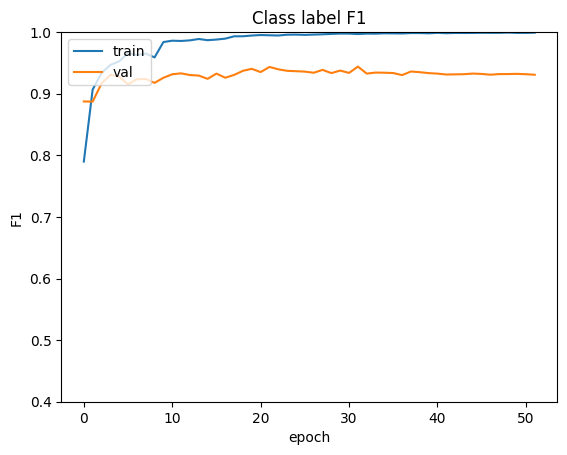

In [9]:
# List data keys in model history variable
print(history.history.keys())

# summarize history for loss
plt.plot(history.history['class_label_f1'])
plt.plot(history.history['val_class_label_f1'])
plt.title('Class label F1')
plt.ylim([0.4, 1])
plt.ylabel('F1')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# summarize history for MAE
# plt.plot(history.history['bounding_box_MAE'])
# plt.plot(history.history['val_bounding_box_MAE'])
# plt.title('Bounding box MAE')
# plt.ylim([0., 1])
# plt.ylabel('MAE')
# plt.xlabel('epoch')
# plt.legend(['train', 'val'], loc='upper left')
# plt.show()

In [10]:
print('Optimal chosen metric score on validation set:', round(max(history.history['val_class_label_f1']), 4))

Optimal chosen metric score on validation set: 0.944


## Prediction Analysis

In [ ]:
# CURRENTLY SET TO VALIDATION PREDICTION ANALYSIS - RERUN FOR TESTING

In [11]:
# Load best model as saved to checkpoint
# pred_model = c.datadir + 'checkpoint/z001_balanced_MAE_damage_model.20230616_123552.json'
pred_model_weights = c.datadir + 'checkpoint/p31_damage_weights.20230710_171935.h5'
# model.load_weights(pred_model_weights)

print('Loading model...')
# with open(pred_model, 'r') as jsonfile:
#     model = model_from_json(jsonfile.read())
model.load_weights(pred_model_weights)
print('Model loading complete...')

Loading model...
Model loading complete...


In [12]:
# Unpack predictions
batch_size = 1
classes = len(c.damage_dict)

# Test dataset for generator
test_dataset = c.datadir + 'hdf5/p31_testing_data.h5'
train_dataset = c.datadir + 'hdf5/p31_training_data.h5'

# Get training dataset mean
with h5py.File(train_dataset, 'r') as hf:
        train_mean = hf['mean'][:]

# Get test dataset
with h5py.File(test_dataset, 'r') as hf:
        test_size = len(hf.get('inputs'))

# Calculate test steps
test_steps = int(np.ceil(test_size / batch_size))

# Create empty lists for truths and predictions
true_y = []
pred_y = []
pred_scores = []

# Define test generator
test_generator = hydragen(test_dataset, train_mean, classes, batch_size=batch_size)

# Start prediction loop
count = 0
while count < test_steps:

    # Get next batch of data from data generator
    test_x_batch, test_y_batch = next(test_generator)
    # If using batch_size = 1
    # test_x_batch = np.expand_dims(test_x_batch, axis=0)           # DO not use without image generator

    # De-batch relevant input data (TRY block for end of (incomplete) batch preds without error)
    for i in range(batch_size):
        try:
            true_y.append([np.argmax(test_y_batch['class_label'][i]), test_y_batch['bounding_box'][i]])
        except:
            pass

    # Make predictions
    preds = model.predict(test_x_batch)


    # De-batch prediction outputs
    for i in range(batch_size):
        try:
            pred_y.append([np.argmax(preds[0][i]), preds[1][i]])
            pred_scores.append(list(preds[i]))
        except:
            pass
        
    # Increment count
    count += 1

print('\nPredictions complete:')
print('Inputs:\t\t{}'.format(len(true_y)))
print('Predictions:\t{}'.format(len(pred_y)))

1/1 [==============================] - 0s 15ms/step

Predictions complete:
Inputs:		1716
Predictions:	1716


#### Class Label Results

Calculating confusion matrix. Please wait...

[[540  13   0  11   0]
 [  0 109   0  11   0]
 [  8   0 590   2   0]
 [ 33   2  23 134   0]
 [  0   0   0   0 240]]

Normalized confusion matrix


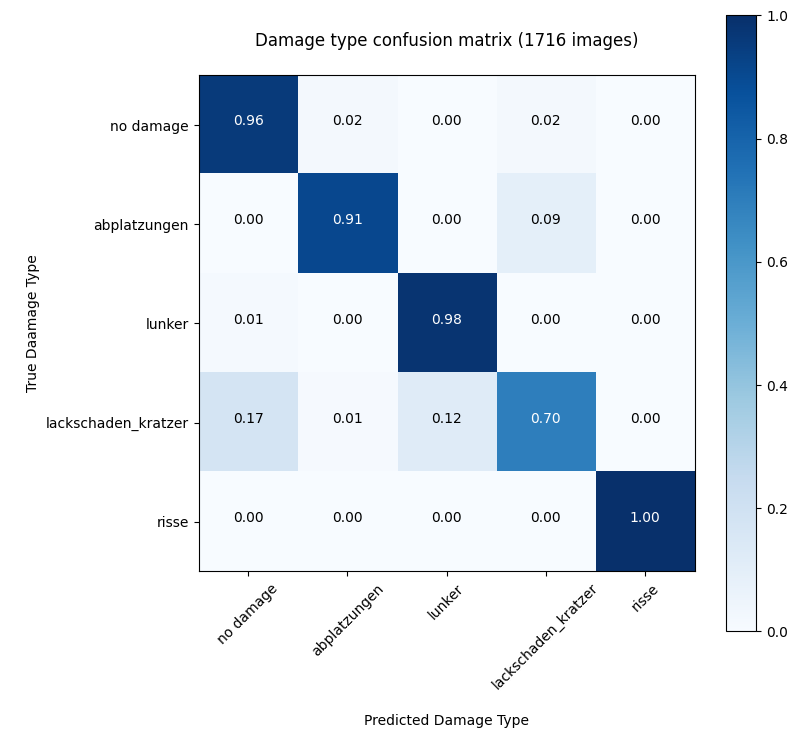

In [13]:
# Plot confusion matrix
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title=f'\nSegmentation Confusion Matrix ({len(true_y)} images)\n',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("\nNormalized confusion matrix")
    else:
        print('\nConfusion matrix, without normalization')

    plt.figure(figsize=(8, 8))
    # Display as percentage
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
               horizontalalignment="center",
               color="white" if cm[i, j] > thresh else "black")

    #   plt.tight_layout()
    # configure and draw the histogram figure
    plt.ylabel("\nTrue Daamage Type")
    plt.xlabel("\nPredicted Damage Type")
    plt.show()
    
    
# Create empty confusion matrix
conf_matrix = np.zeros((classes, classes), dtype='int')

# Verify from test_accuracy calculations
print("Calculating confusion matrix. Please wait...\n")
for i in range(len(true_y)):
    conf_matrix[true_y[i][0]][pred_y[i][0]] += 1
print(conf_matrix)

# Plot confusion matrix
title=f'\nDamage type confusion matrix ({len(true_y)} images)\n'
plot_confusion_matrix(conf_matrix, c.damage_dict.keys(), title=title)

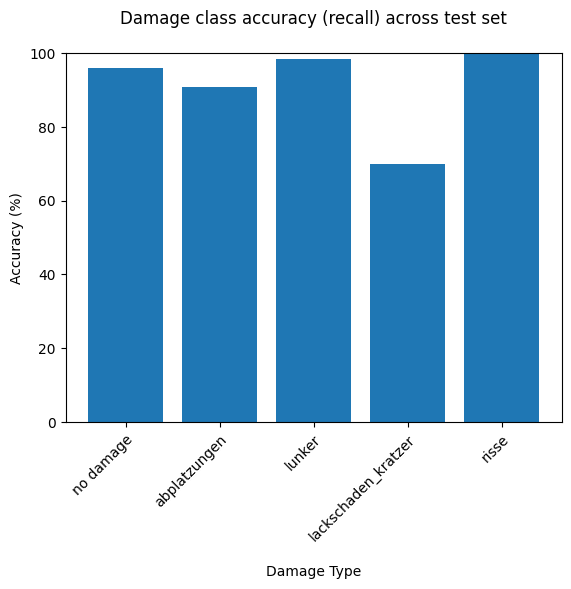

In [14]:
dam_pred_acc = [round(conf_matrix[i][i]/np.sum(conf_matrix[i])*100, 2) for i in range(len(conf_matrix))]

# Plot accuracy for aeach image
plt.title("Damage class accuracy (recall) across test set\n")
plt.xlabel("\nDamage Type")
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylabel("Accuracy (%)")
plt.ylim([0, 100])
plt.bar(c.damage_dict.keys(), dam_pred_acc)
plt.show()

In [15]:
# Fancy classification report
print('Precision:\tRelevance of predicted damage type')
print('Recall:\t\tAccuracy of damage type within class')
print('F1-score:\tHarmonic mean score\n')

print(classification_report([i[0] for i in true_y], [i[0] for i in pred_y], target_names=c.damage_dict.keys(), zero_division=0))


Precision:	Relevance of predicted damage type
Recall:		Accuracy of damage type within class
F1-score:	Harmonic mean score

                     precision    recall  f1-score   support

          no damage       0.93      0.96      0.94       564
       abplatzungen       0.88      0.91      0.89       120
             lunker       0.96      0.98      0.97       600
lackschaden_kratzer       0.85      0.70      0.77       192
              risse       1.00      1.00      1.00       240

           accuracy                           0.94      1716
          macro avg       0.92      0.91      0.92      1716
       weighted avg       0.94      0.94      0.94      1716



### Bounding Box Results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Damage classes: {'no damage': 0, 'abplatzungen': 1, 'lunker': 2, 'lackschaden_kratzer': 3, 'risse': 4} 




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

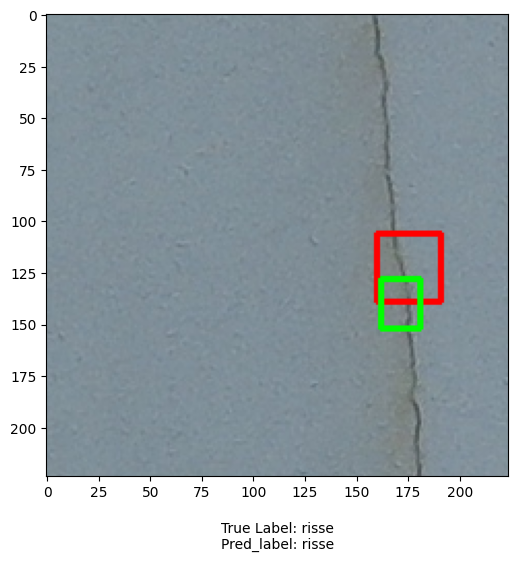

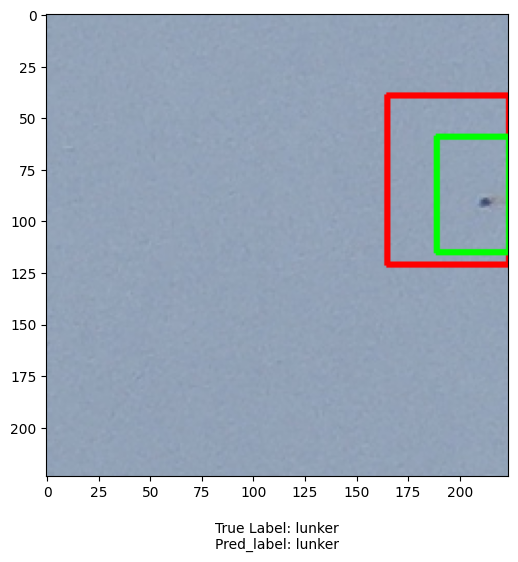

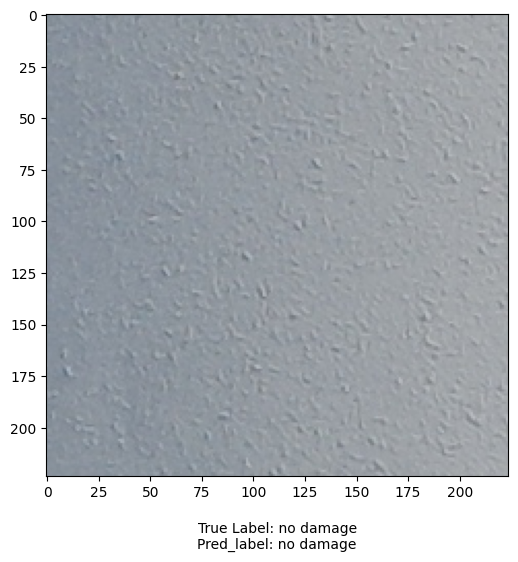

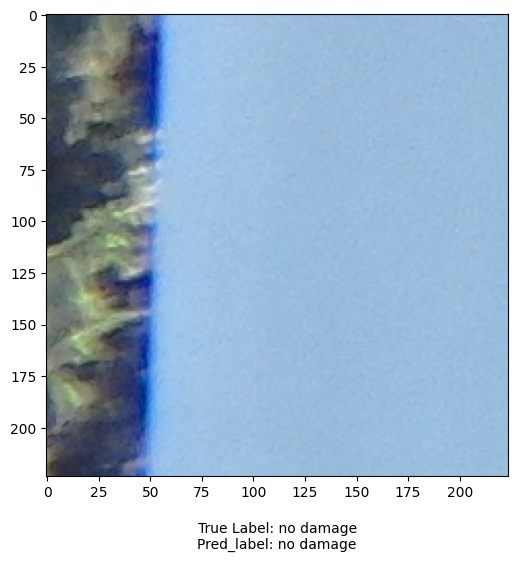

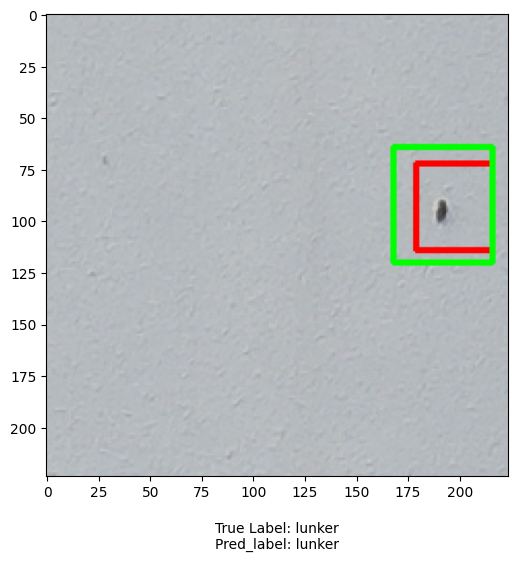

...

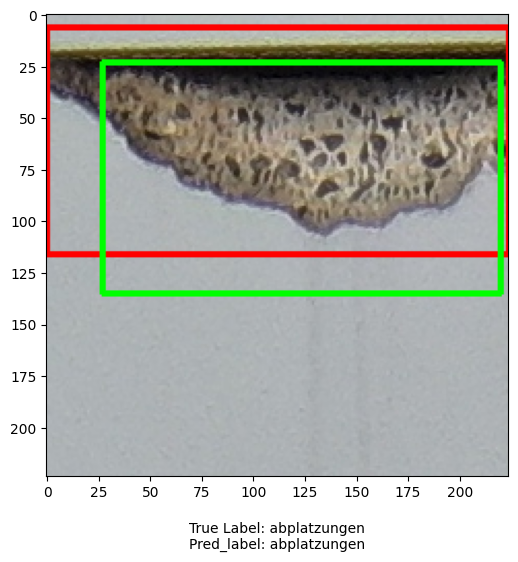

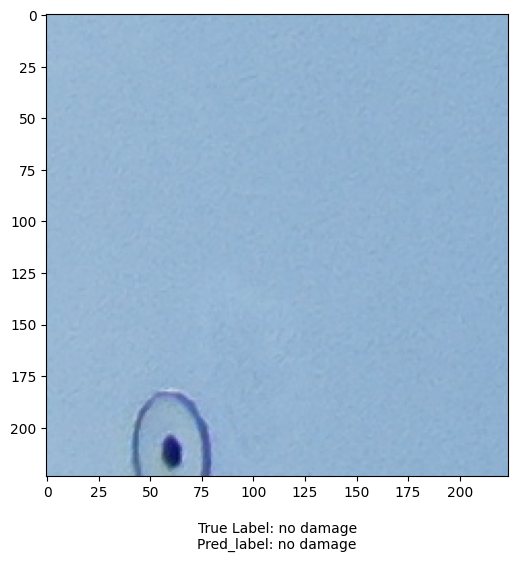

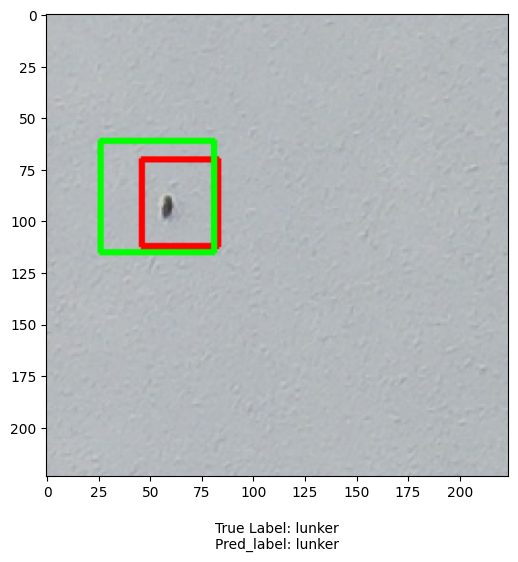

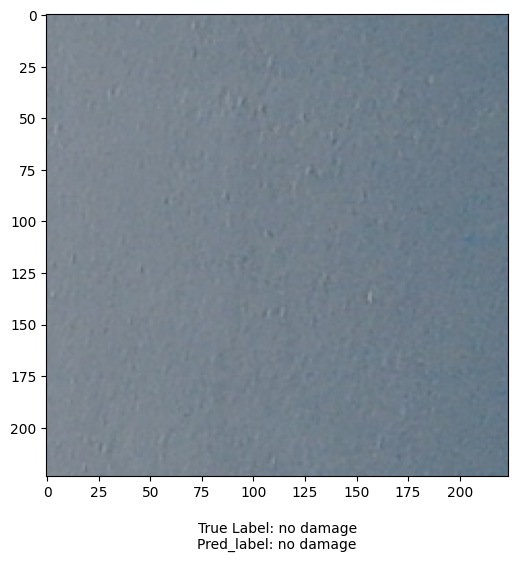

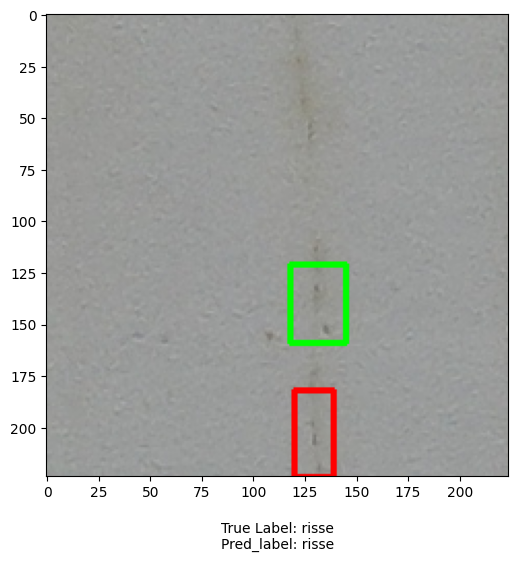

In [16]:
# Load images (outside of generator scope)
imgs = h5py.File(test_dataset, 'r').get('inputs')
labels = h5py.File(test_dataset, 'r').get('targets')
bbox = h5py.File(test_dataset, 'r').get('bboxes')

label = c.damage_dict
print('Damage classes: {}'.format(label), '\n\n')

# Plot image to view results
for idx,img in enumerate(imgs[:50]):
    
    plt.figure(figsize=(6, 6))
    # Scale up the predicted bbox coords based on image size
    # t-true; p-pred coord prefixes
    if labels[idx] != 0:
        tstartX = int(bbox[idx][0])
        tendX = int(bbox[idx][0]+bbox[idx][2])
        tstartY = int(bbox[idx][1])
        tendY = int(bbox[idx][1]+bbox[idx][3])
        img = img/255.
        cv2.rectangle(img, (tstartX, tstartY), (tendX, tendY), (255, 0, 0), 2)

        pstartX = int(max(0, pred_y[idx][1][0]*224))
        pendX = int(max(0, (pred_y[idx][1][0]+pred_y[idx][1][2])*224))
        pstartY = int(max(0, pred_y[idx][1][1]*224))
        pendY = int(max(0, (pred_y[idx][1][1]+pred_y[idx][1][3])*224))
        cv2.rectangle(img, (pstartX, pstartY), (pendX, pendY), (0, 255, 0), 2)
   
    plt.xlabel('\nTrue Label: {}\nPred_label: {}'.format(list(label.keys())[list(label.values()).index([i[0] for i in true_y][idx])],
                                                         list(label.keys())[list(label.values()).index([i[0] for i in pred_y][idx])]))
    plt.imshow(img)    

### Error Analysis - ALL DATA

In [ ]:
# Clean up and extract index information
# pred_scores = [list(i[0]) for i in pred_scores]
true_class = [i[0] for i in true_y]
pred_class = [i[0] for i in pred_y]
err_idx = [i for i, y1, y2 in zip(itertools.count(), true_class, pred_class) if y1 != y2]
true_idx = [i for i, y1, y2 in zip(itertools.count(), true_class, pred_class) if y1 == y2]
print('Error indices:\t', err_idx)
print('True class:\t', [true_class[i] for i in err_idx])
print('Pred class:\t', [pred_class[i] for i in err_idx])

In [ ]:
# Get errors by class and check none missed
err0 = [i for i in err_idx if true_class[i] == 0]
err1 = [i for i in err_idx if true_class[i] == 1]
err2 = [i for i in err_idx if true_class[i] == 2]
err3 = [i for i in err_idx if true_class[i] == 3]
err4 = [i for i in err_idx if true_class[i] == 4]
assert len(err_idx) == len(err0) + len(err1) + len(err2) + len(err3) + len(err4)
print('Error counts')
print('------------')
print('No damage:\t{}'.format(len(err0)))
print('Abplatzungen:\t{}'.format(len(err1)))
print('Lunker:\t\t{}'.format(len(err2)))
print('Lack-Kratz:\t{}'.format(len(err3)))
print('Risse:\t\t{}'.format(len(err4)))

In [ ]:
# Transpose results to get in class lists
data = [i for i in np.squeeze(np.transpose(pred_scores))]


print('Mean and standard deviations for each class')
print('-------------------------------------------')
print('No damage:\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[0]), np.std(data[0]), np.median(data[0])))
print('Abplatzungen:\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[1]), np.std(data[1]), np.median(data[1])))
print('Lunker:\t\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[2]), np.std(data[2]), np.median(data[2])))
print('Lack-Kratz:\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[3]), np.std(data[3]), np.median(data[3])))
print('Risse:\t\tMean {}\t\tStd {}\t\tMedian {}'.format(np.mean(data[4]), np.std(data[4]), np.median(data[4])))


fig = plt.figure(figsize =(8, 8))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, notch ='True', vert = 0)
 
colors = ['#0000FF', '#00FF00', '#FFFF00', '#FF00FF', '#FF0000']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
 
# changing color and linewidth of whiskers
for whisker in bp['whiskers']:
    whisker.set(color ='#8B008B', linewidth = 1.5, linestyle =":")
 
# changing color and linewidth of caps
for cap in bp['caps']:
    cap.set(color ='#8B008B', linewidth = 2)
 
# changing color and linewidth of medians
for median in bp['medians']:
    median.set(color ='red', linewidth = 3)
 
# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='D', color ='#e7298a', alpha = 0.5)
     
# x-axis labels
ax.set_yticklabels(['None', 'Abplatz', 'Lunker', 'Lack_Kr', 'Risse'])
 
# Adding title
plt.title("Box plot of prediction probabilities per class (all predictions)")

# Removing top axes and right axes ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

### Incorrect Prediction Analysis

In [ ]:
# What were probabilities when no damage incorrectly predicted
print('True:', [true_class[i] for i in err0], '\nPred:', [pred_class[i] for i in err0])
display([[list(i) for i in pred_scores[i]] for i in err0])
print('---------------------\n')
print('Max prediction accuracy when prediction is wrong: {}'.format([np.max([list(i) for i in pred_scores[i]]) for i in err0]))

In [ ]:
# What were probabilities when abplatzungen incorrectly predicted
print('True:', [true_class[i] for i in err1], '\nPred:', [pred_class[i] for i in err1])
display([pred_scores[i] for i in err1])
print('---------------------\n')
print('Max prediction accuracy when prediction is wrong: {}'.format([np.max([list(i) for i in pred_scores[i]]) for i in err1]))

In [ ]:
# What were probabilities when true lunken not predicted
print('True:', [true_class[i] for i in err2], '\nPred:', [pred_class[i] for i in err2])
display([pred_scores[i] for i in err2])
print('---------------------\n')
print('Max prediction accuracy when prediction is wrong: {}'.format([np.max([list(i) for i in pred_scores[i]]) for i in err2]))

In [ ]:
# What were probabilities when true lackschaden-kratzer not predicted
print('True:', [true_class[i] for i in err3], '\nPred:', [pred_class[i] for i in err3])
display([pred_scores[i] for i in err3])
print('---------------------\n')
print('Max prediction accuracy when prediction is wrong: {}'.format([np.max([list(i) for i in pred_scores[i]]) for i in err3]))

In [ ]:
# What were probabilities when true risse not predicted
print('True:', [true_class[i] for i in err4], '\nPred:', [pred_class[i] for i in err4])
display([[list(i) for i in pred_scores[i]] for i in err4])
print('---------------------\n')
print('Max prediction accuracy when prediction is wrong: {}'.format([np.max([list(i) for i in pred_scores[i]]) for i in err4]))

In [ ]:
# Create datasets of pred probs for incorrect truths
d0 = [i[0][0] for i in [[list(i) for i in pred_scores[i]] for i in err0]]
d1 = [i[0][1] for i in [[list(i) for i in pred_scores[i]] for i in err1]]
d2 = [i[0][2] for i in [[list(i) for i in pred_scores[i]] for i in err2]]
d3 = [i[0][3] for i in [[list(i) for i in pred_scores[i]] for i in err3]]
d4 = [i[0][4] for i in [[list(i) for i in pred_scores[i]] for i in err4]]
data = [d0, d1, d2, d3, d4]


print('Mean and standard deviations for each class')
print('-------------------------------------------')
print('No damage:\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[0]), np.std(data[0]), np.median(data[0])))
print('Abplatzungen:\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[1]), np.std(data[1]), np.median(data[1])))
print('Lunker:\t\tMean {}\t\tStd {}\t\tMedian {}'.format(np.mean(data[2]), np.std(data[2]), np.median(data[2])))
print('Lack-Kratz:\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[3]), np.std(data[3]), np.median(data[3])))
print('Risse:\t\tMean {}\tStd {}\t\tMedian {}'.format(np.mean(data[4]), np.std(data[4]), np.median(data[4])))

fig = plt.figure(figsize =(8, 8))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, notch ='True', vert = 0)
 
colors = ['#0000FF', '#00FF00', '#FFFF00', '#FF00FF', '#FF0000']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
 
# changing color and linewidth of whiskers
for whisker in bp['whiskers']:
    whisker.set(color ='#8B008B', linewidth = 1.5, linestyle =":")
 
# changing color and linewidth of caps
for cap in bp['caps']:
    cap.set(color ='#8B008B', linewidth = 2)
 
# changing color and linewidth of medians
for median in bp['medians']:
    median.set(color ='red', linewidth = 3)
 
# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='D', color ='#e7298a', alpha = 0.5)
     
# x-axis labels
ax.set_yticklabels(['None', 'Abplatz', 'Lunker', 'Lack_Kr', 'Risse'])
 
# Adding title
plt.title("Prediction probabilities for correct class when wrong")

# Removing top axes and right axes ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

In [ ]:
# Get truth by class and check none missed
true0 = [i for i in true_idx if true_class[i] == 0]
true1 = [i for i in true_idx if true_class[i] == 1]
true2 = [i for i in true_idx if true_class[i] == 2]
true3 = [i for i in true_idx if true_class[i] == 3]
true4 = [i for i in true_idx if true_class[i] == 4]
assert len(true_idx) == len(true0) + len(true1) + len(true2) + len(true3) + len(true4)
print('Truth counts')
print('------------')
print('No damage:\t{}'.format(len(true0)))
print('Abplatzungen:\t{}'.format(len(true1)))
print('Lunker:\t\t{}'.format(len(true2)))
print('Lack-Kratz:\t{}'.format(len(true3)))
print('Risse:\t\t{}'.format(len(true4)))

In [ ]:
# What were probabilities when no damage incorrectly predicted
print('No damage')
print('Max score when prediction is correct: {}'.format(np.max([np.max([list(i) for i in pred_scores[i]]) for i in true0])))
print('Min score when prediction is correct: {}'.format(np.min([np.max([list(i) for i in pred_scores[i]]) for i in true0])))
print('-----------------------------------------------------------------')
print('Abplatzungen')
print('Max score when prediction is correct: {}'.format(np.max([np.max([list(i) for i in pred_scores[i]]) for i in true1])))
print('Min score when prediction is correct: {}'.format(np.min([np.max([list(i) for i in pred_scores[i]]) for i in true1])))
print('-----------------------------------------------------------------')
print('Lunker')
print('Max score when prediction is correct: {}'.format(np.max([np.max([list(i) for i in pred_scores[i]]) for i in true2])))
print('Min score when prediction is correct: {}'.format(np.min([np.max([list(i) for i in pred_scores[i]]) for i in true2])))
print('-----------------------------------------------------------------')
print('Lackschaden-Kratzer')
print('Max score when prediction is correct: {}'.format(np.max([np.max([list(i) for i in pred_scores[i]]) for i in true3])))
print('Min score when prediction is correct: {}'.format(np.min([np.max([list(i) for i in pred_scores[i]]) for i in true3])))
print('-----------------------------------------------------------------')
print('Risse')
print('Max score when prediction is correct: {}'.format(np.max([np.max([list(i) for i in pred_scores[i]]) for i in true4])))
print('Min score when prediction is correct: {}'.format(np.min([np.max([list(i) for i in pred_scores[i]]) for i in true4])))
print('-----------------------------------------------------------------')

In [ ]:
# Transpose results to get in class lists
d0 = [i[0][0] for i in [[list(i) for i in pred_scores[i]] for i in true0]]
d1 = [i[0][1] for i in [[list(i) for i in pred_scores[i]] for i in true1]]
d2 = [i[0][2] for i in [[list(i) for i in pred_scores[i]] for i in true2]]
d3 = [i[0][3] for i in [[list(i) for i in pred_scores[i]] for i in true3]]
d4 = [i[0][4] for i in [[list(i) for i in pred_scores[i]] for i in true4]]
data = [d0, d1, d2, d3, d4]


print('Mean and standard deviations for each class')
print('-------------------------------------------')
print('No damage:\tMean {}\t\tStd {}\t\tMedian {}'.format(np.mean(data[0]), np.std(data[0]), np.median(data[0])))
print('Abplatzungen:\tMean {}\t\tStd {}\t\tMedian {}'.format(np.mean(data[1]), np.std(data[1]), np.median(data[1])))
print('Lunker:\t\tMean {}\t\tStd {}\t\tMedian {}'.format(np.mean(data[2]), np.std(data[2]), np.median(data[2])))
print('Lack-Kratz:\tMean {}\t\tStd {}\t\tMedian {}'.format(np.mean(data[3]), np.std(data[3]), np.median(data[3])))
print('Risse:\t\tMean {}\t\tStd {}\t\tMedian {}'.format(np.mean(data[4]), np.std(data[4]), np.median(data[4])))

fig = plt.figure(figsize =(8, 8))
ax = fig.add_subplot(111)
 
# Creating axes instance
bp = ax.boxplot(data, patch_artist = True, notch ='True', vert = 0)
 
colors = ['#0000FF', '#00FF00', '#FFFF00', '#FF00FF', '#FF0000']
 
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
 
# changing color and linewidth of whiskers
for whisker in bp['whiskers']:
    whisker.set(color ='#8B008B', linewidth = 1.5, linestyle =":")
 
# changing color and linewidth of caps
for cap in bp['caps']:
    cap.set(color ='#8B008B', linewidth = 2)
 
# changing color and linewidth of medians
for median in bp['medians']:
    median.set(color ='red', linewidth = 3)
 
# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='D', color ='#e7298a', alpha = 0.5)
     
# x-axis labels
ax.set_yticklabels(['None', 'Abplatz', 'Lunker', 'Lack_Kr', 'Risse'])
 
# Adding title
plt.title("Box plot of correct prediction probabilities")

# Removing top axes and right axes ticks
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
     
# show plot
plt.show()

#### Thresholding Ideas
1) Often in wrong predictions, the correct prediction is second highest value
2) There is a minimum threshold at which all predictions are correct
3) Look at mean and standard deviation, try prioritising worst performing classes
4) Look at confidence thresholds for the classes

In [ ]:
1